<a href="https://colab.research.google.com/github/chanstst/capstone/blob/main/code/load_map_images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Load images in the map folder

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import re
from math import ceil

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

from skimage import io
from skimage import color
from skimage.transform import rescale, resize, downscale_local_mean

import pickle

In [3]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.models import load_model

In [4]:
# function to load folder into arrays and  then it returns that same array

def load_files(path):
    # Put files into lists and return them as one list of size 4
    image_files = os.listdir(path)
    image_files = [path + x for x in image_files]
    return image_files

In [5]:
# feeding images into numpy ndarray

def load_array(image_files, min_size):
    X = np.array([])
    for file in image_files:
        try:
            img = io.imread(file)
            img_resized = resize(img, (min_size,min_size), anti_aliasing=True)
            if X.shape[0] == 0:
                X = np.array([img_resized])
            else:
                X = np.append(X, [img_resized], axis = 0)
        
        except:
            print("image error: ", file)
    return X

In [6]:
# For reproducibility
np.random.seed(42)

Load the outputs from the first model

In [11]:
df_results = pd.read_csv("/content/drive/MyDrive/Capstone/data/map_output1_all.csv", index_col=0)
df_results.head()

,image_link,pred,prob
0,../images/map/photo-14727385-1B7pWl.jpg,1.0,0.996
1,../images/map/photo-14727436-4FLFxh.jpg,1.0,0.992
2,../images/map/photo-14727437-6pEkHA.jpg,0.0,0.000
3,../images/map/photo-14727440-lhKqRP.jpg,1.0,1.000
4,../images/map/photo-14727449-nAdWfa.jpg,1.0,1.000


Choose the exterior images only

In [13]:
# select "predict" = 1 in the first layer of model
image_files = df_results[df_results["pred"]==1]["image_link"].to_list()
image_files = [x.replace('..','/content/drive/MyDrive/Capstone') for x in image_files]

print(len(image_files))
image_files[:10]

578


['/content/drive/MyDrive/Capstone/images/map/photo-14727385-1B7pWl.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727436-4FLFxh.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727440-lhKqRP.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727449-nAdWfa.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727456-Nt25gC.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727580-jySamt.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727702-5rYrkC.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727757-6rB4aY.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727837-4nhIc3.jpg',
 '/content/drive/MyDrive/Capstone/images/map/photo-14727871-opNjLU.jpg']

Load the trained VGG16 model

In [17]:
path = '/content/drive/MyDrive/Capstone/models/vgg16a'
model = load_model(path)
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 300, 300, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 300, 300, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 300, 300, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 150, 150, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 150, 150, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 150, 150, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 75, 75, 128)       0   

In [18]:
## loading trained scaler
ss = pickle.load(open(path+'/scaler.pkl', 'rb'))
type(ss)

sklearn.preprocessing._data.StandardScaler

In [19]:
def image_std_test(X_test, ss):
    X_test_flat = X_test.reshape(X_test.shape[0],-1)
    X_test_flat_ss = ss.transform(X_test_flat)
    X_test_ss = X_test_flat_ss.reshape(X_test.shape)
    
    return X_test_ss

In [22]:
# Colab min_size = 300
min_size = 300

# iterate with 100 images at one time
max_iter = ceil(len(image_files)/100)+1

for n in range(1,max_iter):
    start = (n-1)*100
    end = min(n*100, len(image_files))

    X = load_array(image_files[start:end], min_size)
    #print(f"X shape = {X.shape}")
    
    X_ss = image_std_test(X, ss)
    y = model.predict(X_ss)
    
    df_output = pd.DataFrame(image_files[start:end], columns=["image_link"])
    df_output["pred"] = y.round(0)
    df_output["prob"] = y.round(3)
    #df_output.head()
    
    df_output.to_csv("/content/drive/MyDrive/Capstone/data/map2/map_output2_"+ str(n) + ".csv")
    


In [23]:
# gather all results

df_results = pd.DataFrame()

for n in range(1, max_iter):
    result = pd.read_csv("/content/drive/MyDrive/Capstone/data/map2/map_output2_"+ str(n) + ".csv", index_col=0)
    df_results = pd.concat([df_results, result])

print(df_results.shape)
df_results.tail()

(578, 3)


,image_link,pred,prob
73,/content/drive/MyDrive/Capstone/images/map/pho...,1.0,1.000
74,/content/drive/MyDrive/Capstone/images/map/pho...,1.0,0.998
75,/content/drive/MyDrive/Capstone/images/map/pho...,0.0,0.016
76,/content/drive/MyDrive/Capstone/images/map/pho...,0.0,0.000
77,/content/drive/MyDrive/Capstone/images/map/pho...,0.0,0.010


In [25]:
df_results.reset_index(drop=True, inplace=True)
df_results.to_csv("/content/drive/MyDrive/Capstone/data/map_output2_all.csv")

Histogram of predicted probabilities

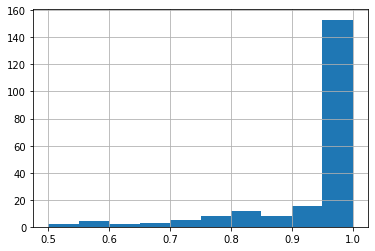

In [26]:
# Modern (>=0.5)
df_results[df_results["prob"]>=0.5]["prob"].hist()

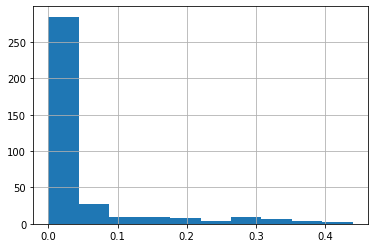

In [27]:
# Period (<0.5)
df_results[df_results["prob"]<0.5]["prob"].hist()

Display results

In [28]:
def display_images(display_no, df_file_info):

    # displaty_no: must be multiples of 10
    # df: must have "image_link" as a field
   
    display_height = display_no/10*16

    fig, ax = plt.subplots(ceil(display_no/2), 2, figsize=(8,display_height))
    j=0
    for i in df_file_info.index[:display_no]:
        row = j//2
        col = j%2
        image_link = df_file_info.loc[i, "image_link"]
        property_id = re.findall('[0-9]{3}[0-9]+',image_link)[0]
        ax[row][col].imshow(io.imread(image_link))
        ax[row][col].axis('off')
        ax[row][col].set_title(property_id)
        j += 1

Images classified as Modern

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


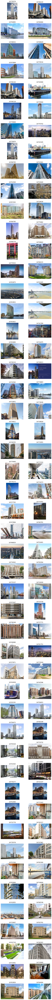

In [29]:
display_no = 100
df_file_info = df_results[df_results["prob"]>=0.9][df_results["prob"]<=1.].sort_values("prob", ascending=False)
display_images(display_no, df_file_info)

Images classified as Period

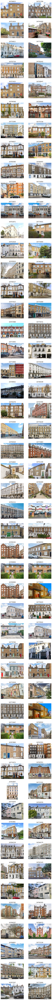

In [30]:
display_no = 100
df_file_info = df_results[df_results["prob"]>=0.][df_results["prob"]<=0.1].sort_values("prob", ascending=True)
display_images(display_no, df_file_info)